<div class="alert alert-info">
<b>Добрый день!</b>
Меня зовут Владимир

# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [91]:
import matplotlib.pyplot as plt
import math
import numpy as np
import nltk
import os
import pandas as pd
import random
import seaborn as sns
import spacy
import time
import torch
import torch.nn as nn
import transformers
import warnings

from math import ceil, sqrt
from numpy import array
from nltk.corpus import stopwords as nltk_stopwords

from PIL import Image
from pathlib import Path

from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score, f1_score, recall_score, precision_score, roc_auc_score, roc_curve, confusion_matrix, accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer 
from sklearn.naive_bayes import ComplementNB
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sqlalchemy import create_engine


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras

from tqdm import notebook
from tqdm import tqdm

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.use_deterministic_algorithms(True)
warnings.filterwarnings("ignore")

pd.set_option('display.float_format', '{:,.2f}'.format)

tqdm.pandas()

In [6]:
path = 'C:/Users/VauDe/Documents/last project/to_upload'

<div class="alert alert-info">
Загрузим данные

In [8]:
train_data = pd.read_csv(os.path.join(path, 'train_dataset.csv'))
train_data.name = 'train_data'
data_crowd = pd.read_csv(os.path.join(path, 'CrowdAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'fraction', 'pros', 'cons'])
data_crowd.name = 'data_crowd'
data_expert = pd.read_csv(os.path.join(path, 'ExpertAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'first', 'second', 'third'])
data_expert.name = 'data_expert'
test_query = pd.read_csv(os.path.join(path, 'test_queries.csv'), index_col=[0], sep='|')
test_query.name = 'test_query'
test_image = pd.read_csv(os.path.join(path, 'test_images.csv'))
test_image.name = 'test_image'

In [9]:
for dataframe in [train_data, data_crowd, data_expert, test_query, test_image]:
    print(dataframe.name)
    display(dataframe.head(5))
    print()

train_data


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



data_crowd


,image,query_id,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,0,3



data_expert


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



test_query


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg



test_image


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<div class="alert alert-info">

Расмотрим как выглядит тренировочные запросы

In [11]:
#display(train_data.loc[0,'query_text'])
display(train_data.loc[train_data['query_id']=='1056338697_4f7d7ce270.jpg#2',])

,image,query_id,query_text
5284,2647049174_0fb47cee2e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f..."


<div class="alert alert-info">

Рассмотрим картинки из тренировочного и тестового наборов

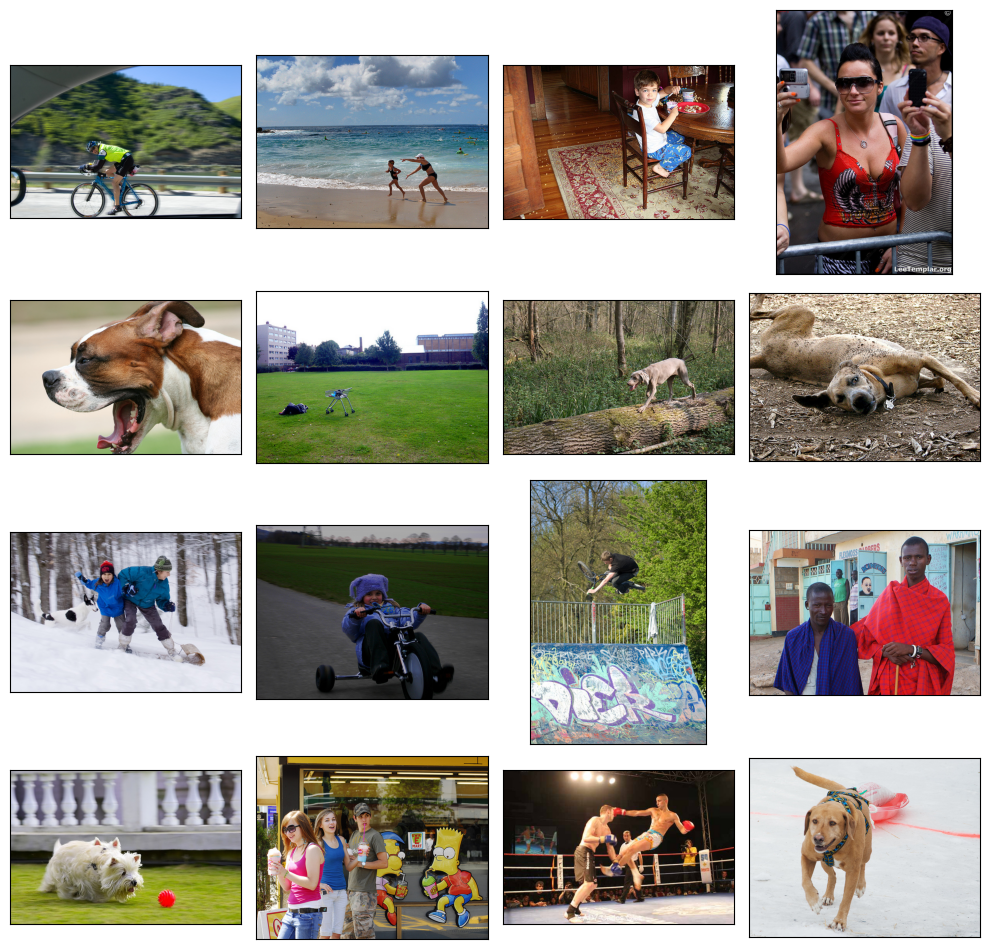

In [13]:
samples_train = list(train_data['image'].sample(8))
samples_test = list(test_query['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(path, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

<div class="alert alert-info">

Аггрегируем оценки экспертов

In [15]:
data_expert['agr_expert']=(data_expert['first'] + data_expert['second'] + data_expert['third']) // 3

In [16]:
display(data_expert['agr_expert'].unique())

array([1, 2, 3, 4], dtype=int64)

<div class="alert alert-info">

Объединим таблицы с оценками экспертов и с краудсорсинговыми данными

In [18]:
data_expert_crowd = data_expert.merge(data_crowd, on = ['image', 'query_id'], how='outer')
display(data_expert_crowd.head())

,image,query_id,first,second,third,agr_expert,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.00,3.00,0.00
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00


<div class="alert alert-info">

Стандартизуем оценки экспертов - приведем их к интервалу от 0 до 1 

In [20]:
data_expert_crowd['agr_expert_new']=round((data_expert_crowd['agr_expert'] - 1) / 3.0, 2)

<div class="alert alert-info">

Для картинок у которых отсутсвуют оценки экспертов будем использовать долю проголосовавших за из краудсорсиноговой разметки

In [22]:
data_expert_crowd['agr_expert_new_new']=data_expert_crowd['agr_expert_new']
data_expert_crowd.loc[data_expert_crowd['agr_expert'].isna()==True,'agr_expert_new_new']=data_expert_crowd['fraction']
display(data_expert_crowd.loc[data_expert_crowd['agr_expert'].isna()==True,])

,image,query_id,first,second,third,agr_expert,fraction,pros,cons,agr_expert_new,agr_expert_new_new
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.00,3.00,0.00,NaN,1.00
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.33,1.00,2.00,NaN,0.33
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.00,3.00,0.00,NaN,1.00
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00


In [23]:
data_expert_crowd['agr_expert_new_new'].unique()

array([1.        , 0.        , 0.33333333, 0.66666667, 0.33      ,
       0.25      , 0.67      , 0.6       , 0.2       , 0.5       ,
       0.4       , 0.75      , 0.16666667, 0.8       ])

<div class="alert alert-info">

Если у краудсорсинговой разметки отсутствыют данные по оценке, то будем использовать оценку экспертов

In [25]:
data_expert_crowd.loc[data_expert_crowd['fraction'].isna()==True,'fraction']=data_expert_crowd['agr_expert_new_new']

<div class="alert alert-info">

Создадим аггрегированную оценку точности соответствия описания картинке, придав вес 0.6 для экспертов и 0.4 для краудсорсиногвой разметке

In [27]:
data_expert_crowd['prob']=data_expert_crowd['agr_expert_new_new']*0.6+data_expert_crowd['fraction']*0.4

In [28]:
data_expert_crowd['prob'].unique()

array([1.        , 0.        , 0.33333333, 0.66666667, 0.33      ,
       0.25      , 0.198     , 0.33133333, 0.402     , 0.53533333,
       0.86666667, 0.67      , 0.802     , 0.46466667, 0.66866667,
       0.6       , 0.2       , 0.13333333, 0.5       , 0.73333333,
       0.298     , 0.602     , 0.598     , 0.278     , 0.562     ,
       0.4       , 0.75      , 0.26666667, 0.16666667, 0.8       ,
       0.502     , 0.398     , 0.722     , 0.702     , 0.1       ])

In [29]:
data_expert_crowd.head()

,image,query_id,first,second,third,agr_expert,fraction,pros,cons,agr_expert_new,agr_expert_new_new,prob
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.00,3.00,0.00,NaN,1.00,1.00
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00,0.00
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00,0.00
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00,0.00
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.00,0.00,3.00,NaN,0.00,0.00


In [30]:
data_expert_crowd_new=data_expert_crowd[['image','query_id','prob']]
display(data_expert_crowd_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     51323 non-null  object 
 1   query_id  51323 non-null  object 
 2   prob      51323 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.2+ MB


None

<div class="alert alert-info">

Объединим таблицы с тренировочными запросами с данными о сводной оценке соответсвия описания картинке

In [32]:
train_data_new = pd.merge(data_expert_crowd_new, train_data, how='left', on=['image', 'query_id'])

In [33]:
display(train_data_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   prob        51323 non-null  float64
 3   query_text  5822 non-null   object 
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


None

<div class="alert alert-info">

Тренировочные данные содержат 51323 записи с информацией о номере картинки, id запроса, оценки соответсвия картинки описанию и текстовое описание. Однако не все запросы имеют тестовое описание, заполним их существующими описаниями.

In [35]:
display(train_data_new.loc[train_data_new['query_id']=='1056338697_4f7d7ce270.jpg#2'])

,image,query_id,prob,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,NaN
7461,2182488373_df73c7cc09.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
15778,2594042571_2e4666507e.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
17018,2647049174_0fb47cee2e.jpg,1056338697_4f7d7ce270.jpg#2,0.00,"A woman is signaling is to traffic , as seen f..."
20110,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
21391,2892995070_39f3c9a56e.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
22589,2934359101_cdf57442dc.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
23446,2981702521_2459f2c1c4.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
26569,311146855_0b65fdb169.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN
28988,3197981073_3156963446.jpg,1056338697_4f7d7ce270.jpg#2,0.00,NaN


In [36]:
train_data_nona = train_data_new[train_data_new['query_text'].notna()]

In [37]:
def fillna_train(row):
    if pd.isnull(row['query_text']):
        text = train_data_nona[train_data_nona['query_id'] == row['query_id']]['query_text']
        if len(text) != 0:
            row['query_text'] = text.iloc[0]
    return row

In [38]:
train_data_new = train_data_new.progress_apply(fillna_train, axis=1)

100%|██████████| 51323/51323 [00:23<00:00, 2171.20it/s]


In [39]:
display(train_data_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   prob        51323 non-null  float64
 3   query_text  50214 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


None

<div class="alert alert-info">
После заполнения отсутствующих описаний, тем не менее остаются отсутствующие значения для некоторых картинок - исключим их.

In [41]:
train_data_new.dropna(inplace=True)
display(train_data_new.head(10))
train_data_new.info()

,image,query_id,prob,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,An older woman with blond hair rides a bicycle...
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.00,A woman wearing a white glove peers over the c...
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.00,A man taking a picture with a silver camera .
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.33,"A woman crosses the street near a man , who is..."
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.00,A man wearing a black shirt and baseball cap s...
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.00,A woman wears sunglasses and a black coat as s...


<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   prob        50214 non-null  float64
 3   query_text  50214 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

<div class="alert alert-info">

Создадим словарик со словами, при наличии которых будет выдаваться сообщение о запрещеном контенте

In [44]:
Block_words = ['child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid', 
               'infant', 'youngster', 'kids', 'children', 'boys', 'girls',
               'babies', 'teens', 'teenagers']

!python -m spacy download en_core_web_sm

In [46]:
nltk.download('stopwords')
stopwords = set(nltk_stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\VauDe\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<div class="alert alert-info">

Лемматизируем описания запросов

In [48]:
tqdm.pandas()

nlp = spacy.load("en_core_web_sm")

train_data_new['query_text_lemm'] = train_data_new['query_text'].progress_apply(
    lambda text: 
        " ".join(
            token.lemma_ for token in nlp(text.lower()) if not token.is_stop))

display(train_data_new.head())

100%|██████████| 50214/50214 [02:54<00:00, 287.48it/s]


,image,query_id,prob,query_text,query_text_lemm
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,"A woman is signaling is to traffic , as seen f...","woman signal traffic , see ."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,A boy in glasses is wearing a red shirt .,boy glass wear red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,A young boy holds onto a blue handle on a pier .,young boy hold blue handle pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,"A woman wearing black clothes , a purple scarf...","woman wear black clothe , purple scarf , pink ..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,An older woman with blond hair rides a bicycle...,old woman blond hair ride bicycle street .


<div class="alert alert-info">

Разметим запросы, содержащие запрещенный контент

In [50]:
train_data_new['blocking'] = train_data_new['query_text_lemm'].progress_apply(
    lambda text: bool(set(text.split()) & set(Block_words)))
    
display(train_data_new.head())

100%|██████████| 50214/50214 [00:00<00:00, 524294.53it/s]


,image,query_id,prob,query_text,query_text_lemm,blocking
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,"A woman is signaling is to traffic , as seen f...","woman signal traffic , see .",False
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,A boy in glasses is wearing a red shirt .,boy glass wear red shirt .,True
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,A young boy holds onto a blue handle on a pier .,young boy hold blue handle pier .,True
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,"A woman wearing black clothes , a purple scarf...","woman wear black clothe , purple scarf , pink ...",False
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,An older woman with blond hair rides a bicycle...,old woman blond hair ride bicycle street .,False


<div class="alert alert-info">

Расмотрим картинки, которые были помечены как запрещенные. Действительно на всех присутствуют дети

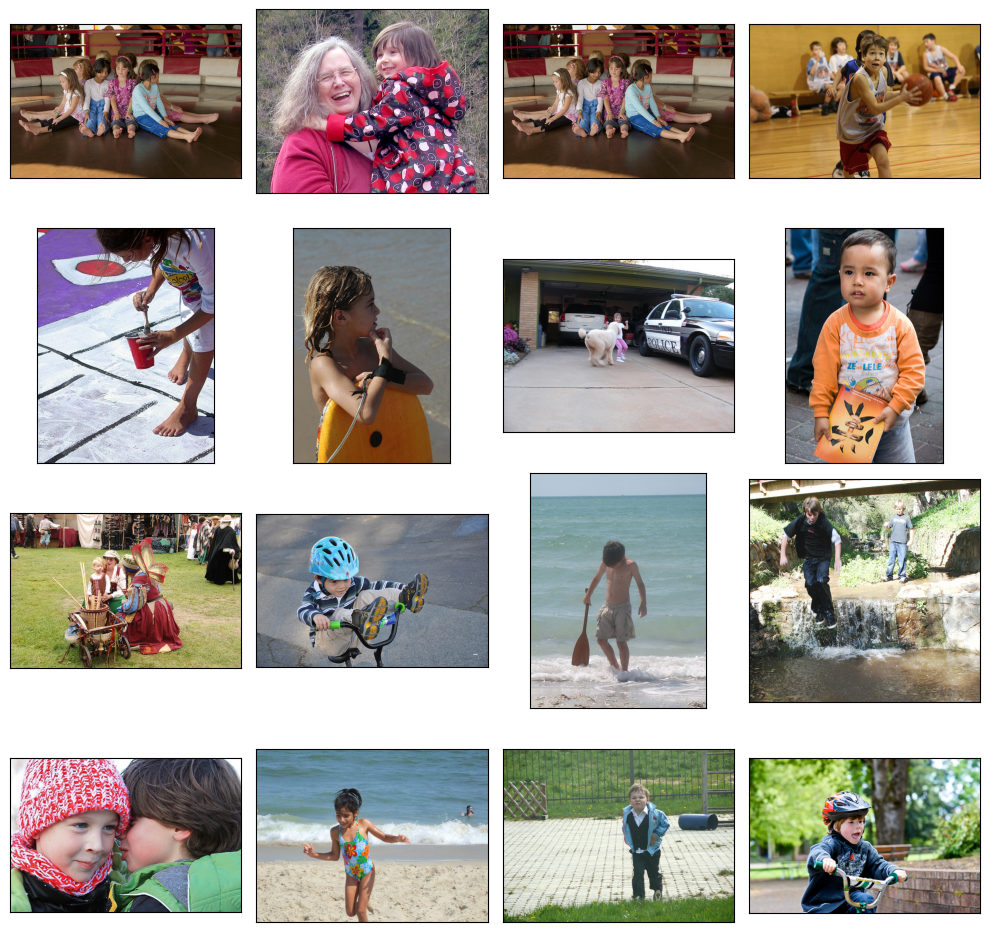

In [52]:
samples_block = list(train_data_new[train_data_new['blocking'] == True]['query_id'].sample(16))

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', samples_block[i][:-2]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

<div class="alert alert-info">

Расмотрим также выборку из незапрещенных катинок. На первый взгляд картинк с запрещенным контеном отсутсвуют

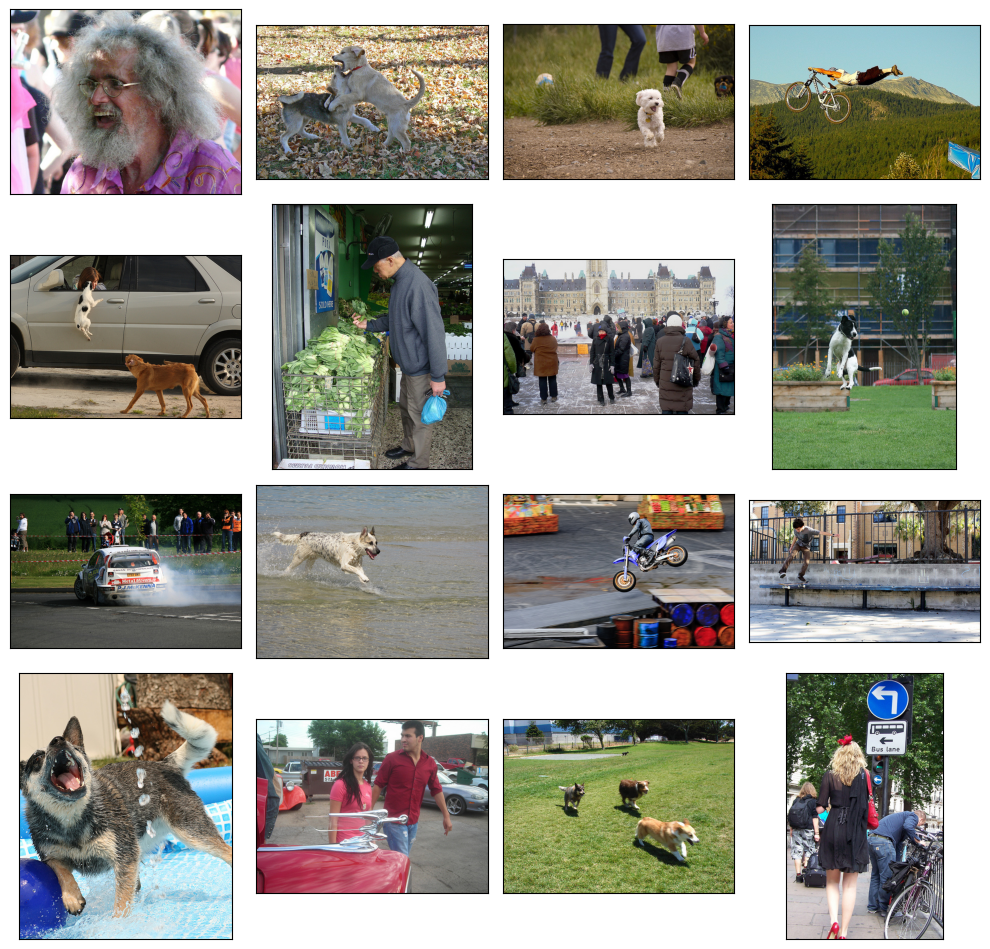

In [54]:
samples_unblock = list(train_data_new[train_data_new['blocking'] == False]['query_id'].sample(16))

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(path, 'train_images', samples_unblock[i][:-2]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

<div class="alert alert-info">

Исключим из тренировочного набора картинки с запрещенным контентом

In [56]:
train_data_new_unblock = train_data_new.loc[train_data_new['blocking'] == False]
train_data_new_unblock.drop(columns=['blocking'], inplace=True)
display(train_data_new_unblock.head())

,image,query_id,prob,query_text,query_text_lemm
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,"A woman is signaling is to traffic , as seen f...","woman signal traffic , see ."
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,"A woman wearing black clothes , a purple scarf...","woman wear black clothe , purple scarf , pink ..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,An older woman with blond hair rides a bicycle...,old woman blond hair ride bicycle street .
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.00,A woman wearing a white glove peers over the c...,woman wear white glove peer crowd .
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.00,A man taking a picture with a silver camera .,man take picture silver camera .


In [57]:
display(train_data_new_unblock.info())

<class 'pandas.core.frame.DataFrame'>
Index: 36125 entries, 0 to 51322
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            36125 non-null  object 
 1   query_id         36125 non-null  object 
 2   prob             36125 non-null  float64
 3   query_text       36125 non-null  object 
 4   query_text_lemm  36125 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.7+ MB


None

<div class="alert alert-info">

Итоговый тренирвочный набор данных содерит информацию о 36125 записях

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

<div class="alert alert-info">

Проведем векторизацию изображений, прибегнув к помощи ResNet-50

In [61]:
seed = 123

In [62]:
def load_train(path):
    datagen = ImageDataGenerator(
        rescale=1/255.,
        #vertical_flip=True,
        #horizontal_flip=True,
        #rotation_range=90,
        #width_shift_range=0.15,
        #height_shift_range=0.15,
        #zoom_range=0.1,
        #validation_split=0.25,
    )

    return datagen.flow_from_dataframe(dataframe=train_data_new_unblock,
                                       directory=Path(path, 'train_images'),
                                       x_col='image',
                                       y_col='prob',
                                       target_size=(224, 224),
                                       batch_size=32,
                                       class_mode='input',
                                       subset='training',
                                       seed=seed)

In [63]:
datagen_flow=load_train(path)
#print(datagen_flow.class_indices)
#train_generator.class_indices

Found 36125 validated image filenames.


In [64]:
features, target = next(datagen_flow)

In [65]:
def create_model(input_shape):
    backbone = ResNet50(
        #weights='/datasets/keras_models/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5',
        weights='imagenet',
        input_shape=input_shape,
        include_top=False)

    #backbone.trainable = False

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())

    #model.add(Flatten())
    #model.add(Dense(64, activation='relu'))

    #model.add(Flatten())
    #model.add(Dense(1, activation='linear'))
    #model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  #loss='sparse_categorical_crossentropy',
                  #loss='mean_squared_error',
                  loss='mse',
                  metrics=['mae'])
    return model

In [66]:
def image_vectorization(model, train_data_new_unblock):
    predictions = model.predict(train_data_new_unblock)
    return predictions

In [67]:
input_shape=(224, 224, 3)

In [68]:
image_embedings = image_vectorization(create_model(input_shape), datagen_flow)
image_embedings.shape

1129/1129 ━━━━━━━━━━━━━━━━━━━━ 1382s 1s/step


(36125, 2048)

<div class="alert alert-info">

Кртинки были разложены на 2048 эмбедингов

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


<div class="alert alert-info">

Проведем векторизацию текстов, используя способ if-idf

In [72]:
tfidf_vectorizer = TfidfVectorizer(stop_words=list(stopwords))

tfidf_matrix = tfidf_vectorizer.fit_transform(train_data_new_unblock['query_text_lemm'])

print(tfidf_matrix.shape)

(36125, 936)


<div class="alert alert-info">

Описания картинок были разложены на 936 эмбедингов

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

<div class="alert alert-info">

Эмбединги картинок и текстов объединим - указанный набор данных будут использоваться в качестве признаков для обучения модели. Оценки точности соответствия описания картинкам будет использоваться в качестве целевого признака.

In [76]:
features_train = np.concatenate((image_embedings, tfidf_matrix.todense()), axis=1)
#features_test = np.column_stack((image_embedings,sparse_tfidf_matrix))
features_train.shape

(36125, 2984)

In [77]:
target_train = np.array(train_data_new_unblock['prob'])
target_train.shape

(36125,)

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

<div class="alert alert-info">

Выделим (Разделим) тз тренировочного датасета на тренировочный и валидационный (тестовый) наборы данных для последующего обучения моделей.

In [80]:
gss = GroupShuffleSplit(n_splits=1, train_size=.75, random_state=42)

train_indices, test_indices = next(gss.split(X=features_train, y=target_train, groups=train_data_new_unblock['image']))

features_train_train, features_train_test = features_train[train_indices], features_train[test_indices]
target_train_train, target_train_test = target_train[train_indices], target_train[test_indices]

print(features_train_train.shape, features_train_test.shape, target_train_train.shape, target_train_test.shape)

(26947, 2984) (9178, 2984) (26947,) (9178,)


<div class="alert alert-info">

Стандартизуем признаки.

In [93]:
scaler = StandardScaler()
scaler.fit(np.asarray(features_train_train))
features_train_train_scaled = scaler.transform(np.asarray(features_train_train))
features_train_test_scaled = scaler.transform(np.asarray(features_train_test))

<div class="alert alert-info">

Обучим линейную регрессию и посмотрим на стандартное отклонение ошибки ее прогноза на тестовых данных.

In [95]:
model_linear = LinearRegression().fit(features_train_train_scaled, target_train_train)
predictions = model_linear.predict(features_train_test_scaled)
np.sqrt(np.sqrt(mean_squared_error(target_train_test, predictions)))

0.45947993625111677

<div class="alert alert-info">

Стандартное отклонение ошибки прогноза близко к 0.5 - что говорит о крайнем низком качестве прогнозов модели, соответствующей качеству случайному предсказанию.

<div class="alert alert-info">

Создадим и обучим полосвязанную нейронную сеть. В качестве метрики качества работы модели будем использовать среднеквадратичное отклонение.

In [98]:
model_nn = Sequential()
model_nn.add(Dense(1024, activation='relu', input_shape=(2984,)))
model_nn.add(BatchNormalization())
model_nn.add(Dense(512, activation='tanh'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(64, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(32, activation='relu'))
model_nn.add(Flatten())
model_nn.add(Dense(1, activation='linear'))

model_nn.compile(optimizer=Adam(learning_rate=0.0001),
                 loss='mse',
                 metrics=[RootMeanSquaredError()])

In [99]:
model_nn.fit(np.asarray(features_train_train),
             target_train_train,
             epochs=8,
             batch_size=32,
             validation_data=(np.asarray(features_train_test), target_train_test),
             validation_steps = math.ceil(np.asarray(features_train_train).shape[1]/32),
             verbose=2)

Epoch 1/8
843/843 - 27s - 32ms/step - loss: 0.1846 - root_mean_squared_error: 0.4296 - val_loss: 0.0673 - val_root_mean_squared_error: 0.2594
Epoch 2/8
843/843 - 25s - 30ms/step - loss: 0.0692 - root_mean_squared_error: 0.2631 - val_loss: 0.0477 - val_root_mean_squared_error: 0.2184
Epoch 3/8
843/843 - 25s - 30ms/step - loss: 0.0572 - root_mean_squared_error: 0.2391 - val_loss: 0.0436 - val_root_mean_squared_error: 0.2087
Epoch 4/8
843/843 - 25s - 30ms/step - loss: 0.0530 - root_mean_squared_error: 0.2303 - val_loss: 0.0427 - val_root_mean_squared_error: 0.2066
Epoch 5/8
843/843 - 26s - 31ms/step - loss: 0.0508 - root_mean_squared_error: 0.2254 - val_loss: 0.0419 - val_root_mean_squared_error: 0.2047
Epoch 6/8
843/843 - 25s - 29ms/step - loss: 0.0491 - root_mean_squared_error: 0.2217 - val_loss: 0.0427 - val_root_mean_squared_error: 0.2066
Epoch 7/8
843/843 - 25s - 29ms/step - loss: 0.0483 - root_mean_squared_error: 0.2198 - val_loss: 0.0440 - val_root_mean_squared_error: 0.2097
Epoch 

<div class="alert alert-info">

Нейронная сеть демонстрирует большую точность совпадения картинок с описаниями. Стандартное отклонение ошибки прогноза на валидационной выборке 0,2075 - это более чем вдвое ниже, чем у линейной регрессии. Проверим работу обученой нейронной сети на тестовом наборе данных.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

<div class="alert alert-info">

Выделим эмбединги картинок и тектовых запросов

In [103]:
def load_test(path):
    datagen = ImageDataGenerator(rescale=1/255.)

    return datagen.flow_from_dataframe(dataframe=test_image,
                                       directory=Path(path, 'test_images'),
                                       x_col='image',
                                       #y_col='prob',
                                       target_size=(224, 224),
                                       batch_size=32,
                                       class_mode='input',
                                       seed=seed)

In [104]:
datagen_flow_test=load_test(path)

Found 100 validated image filenames.


In [105]:
image_embedings_test = image_vectorization(create_model(input_shape), datagen_flow_test)
display(image_embedings_test.shape)

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step


(100, 2048)

<div class="alert alert-info">

Выберем 10 случайных текстовых запросов. Если тестовый запрос содержит информацию запрещенную для показа, то выдается соответтвующее сообщение о недопустимости указанного контента. Для остальных случаев информация о тестовых картинках и запросе - веторизуется и передается в нейронную сеть для поиска наиболее близкого соответсвия запроса тестовым картинкам. Для каждого тектосовго запроса выдается результат из 5 картинок, которые по мнению нейронной сети наиболее соответствующих описанию в порядке возрастания точности описания, а также картинка, котой дано данное описание в тестовом наборе данных.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
A caramel colored dog sits in front of trees looking forward .




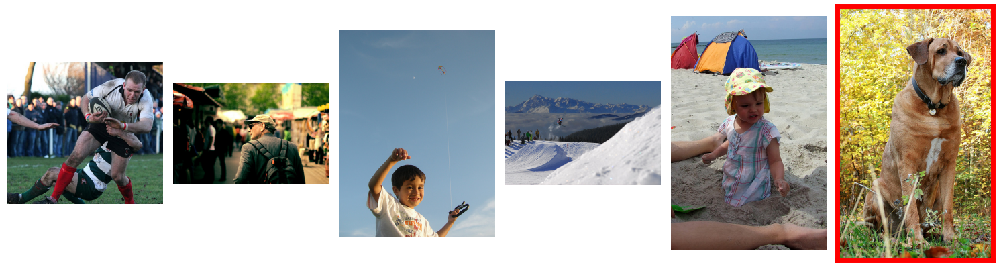


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
a large man dozes off on the bus .




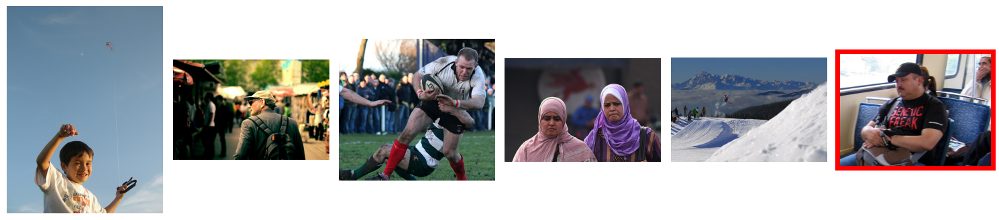

'This image is unavailable in your country in compliance with local laws'


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Seated man looks out at the ocean .




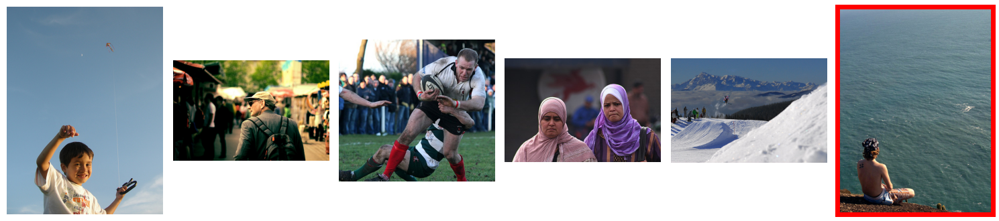

'This image is unavailable in your country in compliance with local laws'

'This image is unavailable in your country in compliance with local laws'


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
a kickboxer jumping for a kick




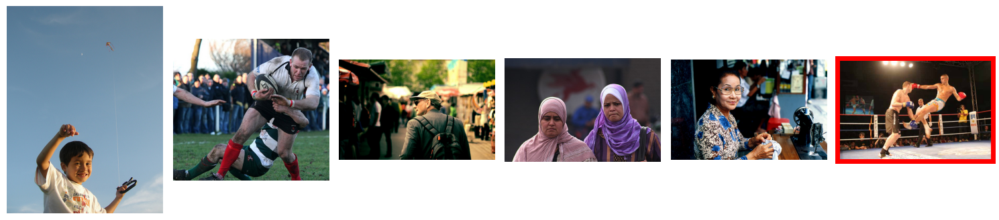


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
the man is wearing a backpack and sunglasses while walking through an outdoor market .




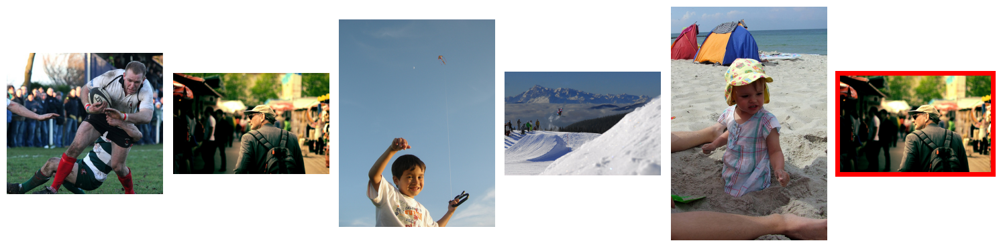


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
The woman with binoculars is sitting on the forest floor looking up .




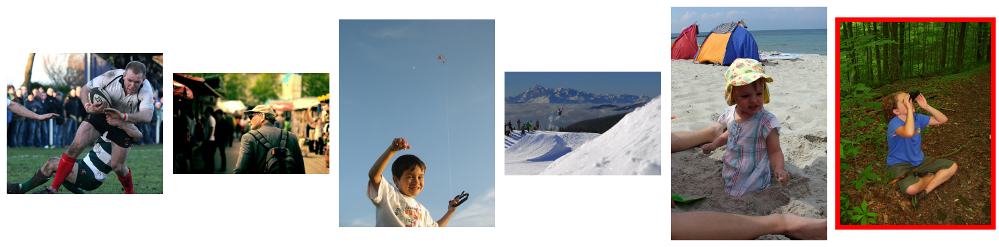


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
A black dog has a dumbbell in his mouth .




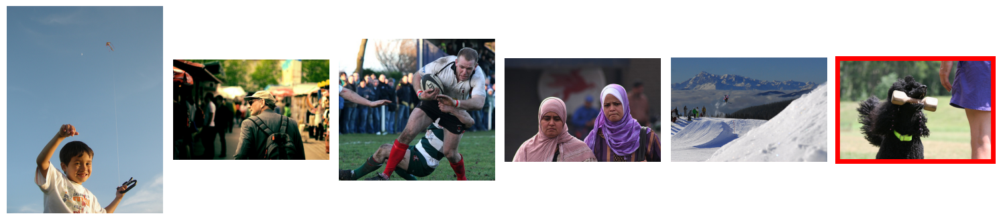

In [118]:
test_text_query = list(test_query['query_text'].sample(10))
for text in test_text_query:
 
    text_query = " ".join(token.lemma_ for token in nlp(text.lower()) if not token.is_stop)

    if bool(set(text_query.split()) & set(Block_words)): 
        display('This image is unavailable in your country in compliance with local laws')
        print()
    else:
        input=[text_query]
        text_query_embedings=tfidf_vectorizer.fit_transform(input)
        #display(image_embedings_test.shape)
        feature_test = np.concatenate((image_embedings_test, np.resize(text_query_embedings.todense(), (image_embedings_test.shape[0],936))), axis=1)
   
        feature_test = scaler.transform(feature_test)
        predictions = model_nn.predict(feature_test)
        
        data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

        print(text)
        print()
        
        fig = plt.figure(figsize=(15,6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, 
                            #title=round(top_score[i], 2)
                           )
            image = Image.open(Path(path, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(test_query['query_text']):
            plt.rcParams['axes.edgecolor'] = 'red'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(path, 'test_images', test_query.iloc[test_query[test_query['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()
        
        plt.show()
        
        print()



<div class="alert alert-info">

<b>Выводы</b>

Что можно заключить из работы:
1) Были отловлены запросы с запрещенным контентом, однако в представленных результатах есть картинки с детьми, что говорит как о возможной необходимости дополнения списка блокирующих слов, так и проверке картинок на содержания ими запрещеного контента перед выдачей
2) в представленных результатах нет ни одного 100% попадания между картинкой, которой было дано описание и рекомендацией, сделанной нейроной сетью, что еще раз подчеркивает достаточно низкое качество нейронной сети и потребность в использовании специализированных нейронных сетей
3) по картинкам модель достаточно точно определяла животных и когда речь шла о каких либо группах людей
4) низкое качество модели может быть также объяснено низким качеством подготовки входных данных, как для векторизации текстов, для которых можно было бы рекомендовать использовать BERT модели, так и более детельной векторизации картинок.

## 8. Выводы

- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска